In [2]:
# Dependencies
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
import holoviews as hv
import hvplot.pandas
import geopandas as gpd
import fiona

In [3]:
# Importing Medicare data
medicare_data_df = pd.read_csv("Data\Medicare_Telehealth_Trends_Q1_2023.csv")
medicare_data_df.head()

,Year,quarter,Bene_Geo_Desc,Bene_Mdcd_Mdcr_Enrl_Stus,Bene_Race_Desc,Bene_Sex_Desc,Bene_Mdcr_Entlmt_Stus,Bene_Age_Desc,Bene_RUCA_Desc,Total_Bene_TH_Elig,Total_PartB_Enrl,Total_Bene_Telehealth,Pct_Telehealth
0,2023,1,Wyoming,Medicare Only,All,All,All,All,All,57582.0,87532.0,3976.0,0.0690
1,2023,1,Wyoming,Medicare & Medicaid,All,All,All,All,All,7781.0,10302.0,1373.0,0.1765
2,2023,1,Wyoming,All,Other/Unknown,All,All,All,All,NaN,NaN,NaN,NaN
3,2023,1,Wyoming,All,Non-Hispanic White,All,All,All,All,59795.0,89194.0,4813.0,0.0805
4,2023,1,Wyoming,All,Hispanic,All,All,All,All,2476.0,3786.0,213.0,0.0860


In [4]:
# Checking where NaN values come from
medicare_data_df.loc[medicare_data_df["Total_Bene_TH_Elig"].isna()].groupby(["Bene_Race_Desc","Bene_RUCA_Desc"]).count()

Year  quarter  Bene_Geo_Desc  \
Bene_Race_Desc                Bene_RUCA_Desc                                 
All                           All               16       16             16   
                              Rural             16       16             16   
                              Unknown          864      864            864   
American Indian/Alaska Native All                8        8              8   
                              Unknown           16       16             16   
Asian/Pacific Islander        Unknown           16       16             16   
Black/African American        Unknown           16       16             16   
Hispanic                      Unknown           16       16             16   
Non-Hispanic White            Unknown           16       16             16   
Other/Unknown                 All             1008     1008           1008   
                              Rural             16       16             16   
                              Unknown           16       16             16   
                              Urban             16       16             16   

                                              Bene_Mdcd_Mdcr_Enrl_Stus  \
Bene_Race_Desc                Bene_RUCA_Desc                             
All                           All                                   16   
                              Rural                                 16   
                              Unknown                              864   
American Indian/Alaska Native All                                    8   
                              Unknown                               16   
Asian/Pacific Islander        Unknown                               16   
Black/African American        Unknown                               16   
Hispanic                      Unknown                               16   
Non-Hispanic White            Unknown                               16   
Other/Unknown                 All                                 1008   
                              Rural                                 16   
                              Unknown                               16   
                              Urban                                 16   

                                              Bene_Sex_Desc  \
Bene_Race_Desc                Bene_RUCA_Desc                  
All                           All                        16   
                              Rural                      16   
                              Unknown                   864   
American Indian/Alaska Native All                         8   
                              Unknown                    16   
Asian/Pacific Islander        Unknown                    16   
Black/African American        Unknown                    16   
Hispanic                      Unknown                    16   
Non-Hispanic White            Unknown                    16   
Other/Unknown                 All                      1008   
                              Rural                      16   
                              Unknown                    16   
                              Urban                      16   

                                              Bene_Mdcr_Entlmt_Stus  \
Bene_Race_Desc                Bene_RUCA_Desc                          
All                           All                                16   
                              Rural                              16   
                              Unknown                           864   
American Indian/Alaska Native All                                 8   
                              Unknown                            16   
Asian/Pacific Islander        Unknown                            16   
Black/African American        Unknown                            16   
Hispanic                      Unknown                            16   
Non-Hispanic White            Unknown                            16   
Other/Unknown                 All    

In [5]:
# Cleaning up columns
cleaned_data = medicare_data_df.rename(columns={"Bene_Geo_Desc": "State", "Bene_Mdcd_Mdcr_Enrl_Stus": "Medicare/Medicaid","Bene_Race_Desc": "Race",
                                 "Bene_Sex_Desc": "Sex", "Bene_Mdcr_Entlmt_Stus":"Entitlement Status", "Bene_Age_Desc":"Age","Bene_RUCA_Desc":"Locality","Total_Bene_TH_Elig":"Total Telehealth-Eligible Users",
                                 "Total_PartB_Enrl":"Part B Enrollment","Total_Bene_Telehealth":"Telehealth Users","Pct_Telehealth":"Percent of Telehealth Users"}).dropna().reset_index(drop=True)
cleaned_data.head()

,Year,quarter,State,Medicare/Medicaid,Race,Sex,Entitlement Status,Age,Locality,Total Telehealth-Eligible Users,Part B Enrollment,Telehealth Users,Percent of Telehealth Users
0,2023,1,Wyoming,Medicare Only,All,All,All,All,All,57582.0,87532.0,3976.0,0.0690
1,2023,1,Wyoming,Medicare & Medicaid,All,All,All,All,All,7781.0,10302.0,1373.0,0.1765
2,2023,1,Wyoming,All,Non-Hispanic White,All,All,All,All,59795.0,89194.0,4813.0,0.0805
3,2023,1,Wyoming,All,Hispanic,All,All,All,All,2476.0,3786.0,213.0,0.0860
4,2023,1,Wyoming,All,Black/African American,All,All,All,All,263.0,462.0,33.0,0.1255


In [6]:
#Checking total counts by year
cleaned_data.groupby("Year").count()

,quarter,State,Medicare/Medicaid,Race,Sex,Entitlement Status,Age,Locality,Total Telehealth-Eligible Users,Part B Enrollment,Telehealth Users,Percent of Telehealth Users
Year,,,,,,,,,,,,
2020,5374,5374,5374,5374,5374,5374,5374,5374,5374,5374,5374,5374
2021,5380,5380,5380,5380,5380,5380,5380,5380,5380,5380,5380,5380
2022,5375,5375,5375,5375,5375,5375,5375,5375,5375,5375,5375,5375
2023,1074,1074,1074,1074,1074,1074,1074,1074,1074,1074,1074,1074


In [7]:
#Separating National data from State data
national = cleaned_data.loc[(cleaned_data["State"] == "National") & (cleaned_data['quarter']!="Overall")]
state = cleaned_data.loc[(cleaned_data["State"] != "National") & (cleaned_data['quarter']!="Overall")]

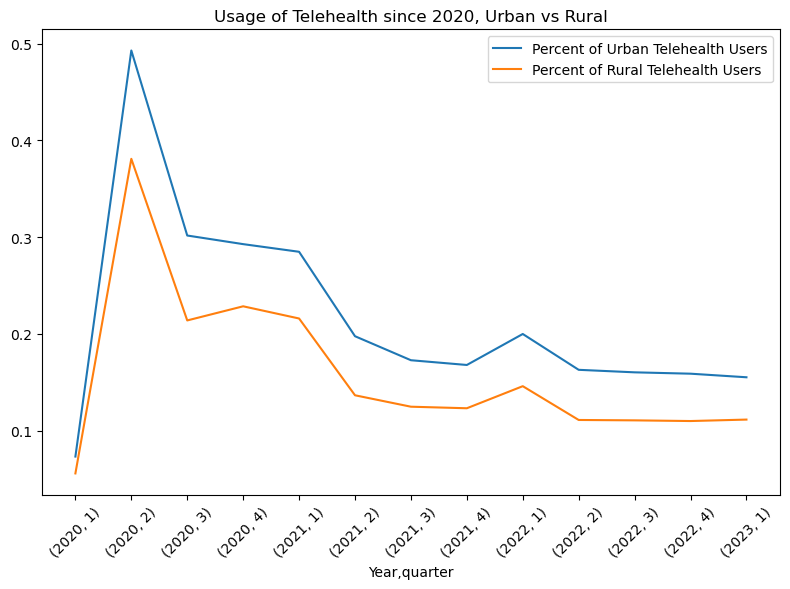

In [8]:
# Getting National data by locality
national_locality = national.loc[(national["Age"] == "All") & (national['Entitlement Status']== "All") & (national['Locality']!= "Unknown") & 
                                (national['Locality']!= "All")& (national["Medicare/Medicaid"]== "All") & (national['Race']== "All")
                                & (national['Sex']== "All")].reset_index(drop=True)
# Separating into Urban and Rural
urban = national_locality.loc[national_locality['Locality']=="Urban"][['Locality',"Percent of Telehealth Users","Year",'quarter']]
rural = national_locality.loc[national_locality['Locality']=="Rural"][['Locality',"Percent of Telehealth Users","Year",'quarter']]
# Sorting by year and quarter
urban_sorted = urban.sort_values(by=['Year','quarter']).reset_index(drop=True)
rural_sorted = rural.sort_values(by=['Year','quarter']).reset_index(drop=True)
# Merging values on year and quarter and renaming columns
urban_rural = pd.merge(urban_sorted,rural_sorted,how='left',on=['Year','quarter']).set_index(["Year","quarter"]).rename(columns={'Percent of Telehealth Users_x':"Percent of Urban Telehealth Users",
                                                                'Percent of Telehealth Users_y':"Percent of Rural Telehealth Users"})
# Plotting
ax = urban_rural.plot(y=['Percent of Urban Telehealth Users','Percent of Rural Telehealth Users'],
                                            title="Usage of Telehealth since 2020, Urban vs Rural",rot=45,
                                            xticks=range(len(urban_rural)),figsize=(8,6))
plt.tight_layout()
plt.savefig("Graphs/Urban_v_Rural_Line")

In [25]:
# Getting exact difference values between urban and rural for analysis
urban.reset_index(drop=True,inplace=True)
urban['Difference between Urban and Rural'] = urban['Percent of Telehealth Users'].reset_index(drop=True)-rural['Percent of Telehealth Users'].reset_index(drop=True)
urban[["Year",'quarter',"Difference between Urban and Rural"]]

,Year,quarter,Difference between Urban and Rural
0,2023,1,0.0437
1,2022,4,0.0489
2,2022,3,0.0496
3,2022,2,0.0518
4,2022,1,0.0539
5,2021,4,0.0447
6,2021,3,0.0480
7,2021,2,0.0610
8,2021,1,0.0689
9,2020,4,0.0642


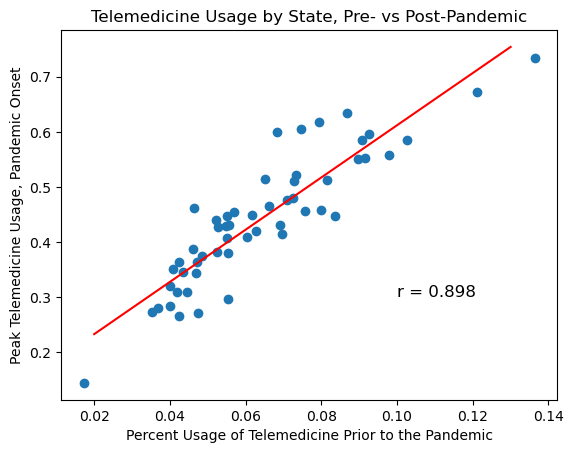

In [62]:
# Getting overall data for each state
overall_states = state.loc[(state["Age"] == "All") & (state['Entitlement Status']== "All") & (state['Locality']== "All") & (state["Medicare/Medicaid"]== "All") & (state['Race']== "All")
                            & (state['Sex']== "All")].reset_index(drop=True).groupby(["State"])["Percent of Telehealth Users"]
# Calculating range and mean by state
states_means = overall_states.mean()
states_min = overall_states.min()
states_max = overall_states.max()
states_range = states_max - states_min
# Creating Scatter Plot of minimum vs maximum usage
plt.scatter(states_min,states_max)
plt.xlabel("Percent Usage of Telemedicine Prior to the Pandemic")
plt.ylabel("Peak Telemedicine Usage, Pandemic Onset")
plt.title("Telemedicine Usage by State, Pre- vs Post-Pandemic")
# Adding regression values and line
regress = stats.linregress(states_min,states_max)
plt.savefig("Graphs/Scatter_Plot.png")
slope = regress[0]
intercept = regress[1]
r_value = regress[2]
x_values = np.arange(0.02,0.14,0.01)
y_values = x_values*slope+intercept
plt.plot(x_values,y_values,c='red')
plt.annotate(f"r = {round(r_value,3)}",(0.1,0.3),fontsize = 12)
plt.savefig("Graphs/Scatter_Plot.png")

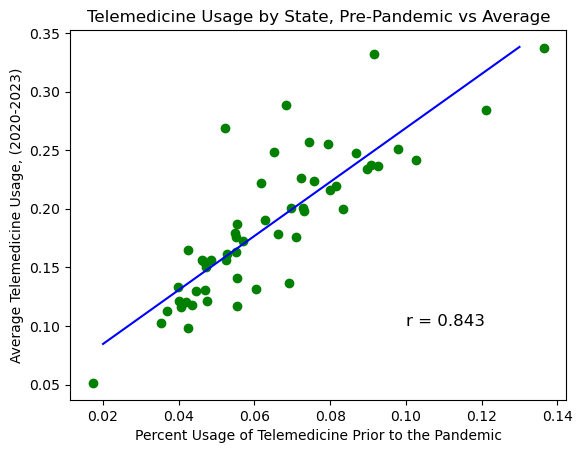

In [61]:
# Creating Scatter Plot of minimum vs average usage
plt.scatter(states_min,states_means,c='green')
plt.xlabel("Percent Usage of Telemedicine Prior to the Pandemic")
plt.ylabel("Average Telemedicine Usage, (2020-2023)")
plt.title("Telemedicine Usage by State, Pre-Pandemic vs Average")
# Adding regression values and line
regress = stats.linregress(states_min,states_means)
plt.savefig("Graphs/Scatter_Plot.png")
slope = regress[0]
intercept = regress[1]
r_value = regress[2]
x_values = np.arange(0.02,0.14,0.01)
y_values = x_values*slope+intercept
plt.plot(x_values,y_values,c='blue')
plt.annotate(f"r = {round(r_value,3)}",(0.1,0.1),fontsize = 12)
plt.savefig("Graphs/Scatter_Plot_2.png")

In [8]:
# Importing polygons of all U.S. States
polygons_df = gpd.read_file("data/cb_2018_us_state_500k/cb_2018_us_state_500k.shp")
# Changing name so it matches the other dataset
polygons_df.iloc[38,5] = "Virgin Islands"
# Dropping unusable polygons (don't appear in telehealth data)
polygons_cleaned = polygons_df.loc[(polygons_df["NAME"]!="American Samoa")&(polygons_df["NAME"]!="Commonwealth of the Northern Mariana Islands")&(
    polygons_df["NAME"]!="Guam")].sort_values(by=["NAME"]).reset_index(drop=True)
# Turning range into a DataFrame
range_df = pd.DataFrame(states_range).reset_index()
# Dropping unusable data
range_df = range_df.loc[range_df['State']!="Territories"].reset_index(drop=True)
# Combining data and polygons
combined_states = pd.concat([range_df,polygons_cleaned],join='outer',axis=1)
# Setting up dataframe for GeoPandas
combined_states.rename(columns={0:"geometry"},inplace=True)
plotting = combined_states[["State","Percent of Telehealth Users",'geometry']]

In [25]:
# Turning into GeoDataFrame
range_geo_df = gpd.GeoDataFrame(plotting, geometry='geometry')
# Plotting
plot1 = range_geo_df.hvplot(color="Percent of Telehealth Users",tiles="CartoLight",xlim=(-180,-30),width = 1200,height = 900,title="Change in Peak Telehealth Usage by State (2020-2023)",fontsize=20,xlabel="",ylabel="",
                            group_label = "Change in Percent of Telehealth Users")
plot1

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (Percent of Telehealth Users)

In [10]:
# Same as previous two blocks, but using the means of the states
means_df = pd.DataFrame(states_means).reset_index()
means_df = means_df.loc[means_df['State']!="Territories"].reset_index(drop=True)
combined_states_2 = pd.concat([means_df,polygons_cleaned],join='outer',axis=1)
combined_states_2.rename(columns={0:"geometry"},inplace=True)
plotting_2 = combined_states_2[["State","Percent of Telehealth Users",'geometry']]

In [26]:
# Same as previous two blocks, but using the means of the states
means_geo_df = gpd.GeoDataFrame(plotting_2, geometry='geometry')
plot2 = means_geo_df.hvplot(color="Percent of Telehealth Users",tiles="OSM",xlim=(-180,-50),width = 1200,height = 850,title="Average Telehealth Usage by State (2020-2023)",fontsize=20,xlabel="",ylabel="")
plot2

:Overlay
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (Percent of Telehealth Users)